In [6]:
#Installing Pre-requisites and Import necessary libraries 
# !pip install pycountry_convert # -- provides converstion fuctions with ISO country names, country-codes, and continent names.
# !pip install folium            # -- provides fuction for interactive maps.
# !pip install calmap
# !pip install Tensorflow

### Rest basic lib are already installed, hence i will be importing them directly 

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker 
import pycountry_convert as pc
import folium
import branca
from datetime import datetime, timedelta,date
from scipy.interpolate import make_interp_spline, BSpline
import plotly.express as px
import json, requests
import calmap

from keras.layers import Input, Dense, Activation, LeakyReLU, Dropout
from keras import models
from keras.optimizers import RMSprop, Adam

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline


In [7]:
"""Getting the datasets from Johns Hopkinsons CSSE link"""
#loading the dataset 
# Retriving Dataset
df_confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')

# Depricated
# df_recovered = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_19-covid-Recovered.csv')
df_covid19 = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")
df_table = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",parse_dates=['Last_Update'])

In [25]:
print("Confirmed Dataframe is:  ",df_confirmed.shape )
# print("Death Dataframe is:  ",df_deaths.head() )
# print("covid19 Dataframe is:  ",df_covid19.head() )
# print("table Dataframe is:  ",df_table.head(2) )

Confirmed Dataframe is:   (266, 260)


In [27]:
# df_covid19 = df_covid19.drop(["People_Tested","People_Hospitalized","UID","ISO3","Mortality_Rate"],axis =1)
df_covid19.head(2)

,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate
0,Afghanistan,2020-10-04 18:23:43,33.93911,67.709953,39341.0,1462.0,32852.0,5027.0,101.060048
1,Albania,2020-10-04 18:23:43,41.15330,20.168300,14266.0,396.0,8675.0,5195.0,495.725902


In [28]:
df_confirmed.head(2)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,39170,39186,39192,39227,39233,39254,39268,39285,39290,39297
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,12921,13045,13153,13259,13391,13518,13649,13806,13965,14117


# Preprocessing the datasets 


In [29]:
df_confirmed = df_confirmed.rename(columns={"Province/State":"state","Country/Region": "country"})
df_deaths = df_deaths.rename(columns={"Province/State":"state","Country/Region": "country"})
df_covid19 = df_covid19.rename(columns={"Country_Region": "country"})
df_covid19["Active"] = df_covid19["Confirmed"]-df_covid19["Recovered"]-df_covid19["Deaths"]
# df_recovered = df_recovered.rename(columns={"Province/State":"state","Country/Region": "country"})

In [30]:
# Changing the conuntry names as required by pycountry_convert Lib
df_confirmed.loc[df_confirmed['country'] == "US", "country"] = "USA"
df_deaths.loc[df_deaths['country'] == "US", "country"] = "USA"
df_covid19.loc[df_covid19['country'] == "US", "country"] = "USA"
df_table.loc[df_table['Country_Region'] == "US", "Country_Region"] = "USA"
# df_recovered.loc[df_recovered['country'] == "US", "country"] = "USA"


df_confirmed.loc[df_confirmed['country'] == 'Korea, South', "country"] = 'South Korea'
df_deaths.loc[df_deaths['country'] == 'Korea, South', "country"] = 'South Korea'
df_covid19.loc[df_covid19['country'] == "Korea, South", "country"] = "South Korea"
df_table.loc[df_table['Country_Region'] == "Korea, South", "Country_Region"] = "South Korea"
# df_recovered.loc[df_recovered['country'] == 'Korea, South', "country"] = 'South Korea'

df_confirmed.loc[df_confirmed['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_deaths.loc[df_deaths['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_covid19.loc[df_covid19['country'] == "Taiwan*", "country"] = "Taiwan"
df_table.loc[df_table['Country_Region'] == "Taiwan*", "Country_Region"] = "Taiwan"
# df_recovered.loc[df_recovered['country'] == 'Taiwan*', "country"] = 'Taiwan'

df_confirmed.loc[df_confirmed['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Kinshasa)", "country"] = "Democratic Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Kinshasa)", "Country_Region"] = "Democratic Republic of the Congo"
# df_recovered.loc[df_recovered['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'

df_confirmed.loc[df_confirmed['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_deaths.loc[df_deaths['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_covid19.loc[df_covid19['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_table.loc[df_table['Country_Region'] == "Cote d'Ivoire", "Country_Region"] = "Côte d'Ivoire"
# df_recovered.loc[df_recovered['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"

df_confirmed.loc[df_confirmed['country'] == "Reunion", "country"] = "Réunion"
df_deaths.loc[df_deaths['country'] == "Reunion", "country"] = "Réunion"
df_covid19.loc[df_covid19['country'] == "Reunion", "country"] = "Réunion"
df_table.loc[df_table['Country_Region'] == "Reunion", "Country_Region"] = "Réunion"
# df_recovered.loc[df_recovered['country'] == "Reunion", "country"] = "Réunion"

df_confirmed.loc[df_confirmed['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Brazzaville)", "country"] = "Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Brazzaville)", "Country_Region"] = "Republic of the Congo"
# df_recovered.loc[df_recovered['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'

df_confirmed.loc[df_confirmed['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_deaths.loc[df_deaths['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_covid19.loc[df_covid19['country'] == "Bahamas, The", "country"] = "Bahamas"
df_table.loc[df_table['Country_Region'] == "Bahamas, The", "Country_Region"] = "Bahamas"
# df_recovered.loc[df_recovered['country'] == 'Bahamas, The', "country"] = 'Bahamas'

df_confirmed.loc[df_confirmed['country'] == 'Gambia, The', "country"] = 'Gambia'
df_deaths.loc[df_deaths['country'] == 'Gambia, The', "country"] = 'Gambia'
df_covid19.loc[df_covid19['country'] == "Gambia, The", "country"] = "Gambia"
df_table.loc[df_table['Country_Region'] == "Gambia", "Country_Region"] = "Gambia"
# df_recovered.loc[df_recovered['country'] == 'Gambia, The', "country"] = 'Gambia'

# getting all countries
countries = np.asarray(df_confirmed["country"])
countries1 = np.asarray(df_covid19["country"])
# Continent_code to Continent_names
continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Australia',
    'AF': 'Africa',
    'EU' : 'Europe',
    'na' : 'Others'
}

# Defininng Function for getting continent code for country.
def country_to_continent_code(country):
    try:
        return pc.country_alpha2_to_continent_code(pc.country_name_to_country_alpha2(country))
    except :
        return 'na'

#Collecting Continent Information
df_confirmed.insert(2,"continent", [continents[country_to_continent_code(country)] for country in countries[:]])
df_deaths.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in countries[:]])
df_covid19.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in countries1[:]])
df_table.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in df_table["Country_Region"].values])
# df_recovered.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in countries[:]] )   

In [33]:
df_table = df_table[df_table["continent"] != "Others"]

In [32]:
df_deaths[df_deaths["continent" ]== 'Others']

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20
34,NaN,Burma,Others,21.916200,95.956000,0,0,0,0,0,...,155,174,198,226,256,284,310,321,353,371
102,NaN,Diamond Princess,Others,0.000000,0.000000,0,0,0,0,0,...,13,13,13,13,13,13,13,13,13,13
139,NaN,Holy See,Others,41.902900,12.453400,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
156,NaN,Kosovo,Others,42.602636,20.902977,0,0,0,0,0,...,488,488,488,488,488,488,488,488,488,488
168,NaN,MS Zaandam,Others,0.000000,0.000000,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,2
237,NaN,Timor-Leste,Others,-8.874217,125.727539,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
261,NaN,West Bank and Gaza,Others,31.952200,35.233200,0,0,0,0,0,...,274,278,285,291,299,306,311,318,321,329
262,NaN,Western Sahara,Others,24.215500,-12.885800,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1


In [34]:
# df_active = df_confirmed.copy()
# df_active.iloc[:,5:] = df_active.iloc[:,5:] - df_recovered.iloc[:,5:] - df_deaths.iloc[:,5:]
# df_active.head(5)

NameError: name 'df_recovered' is not defined

In [35]:
df_confirmed = df_confirmed.replace(np.nan, '', regex=True)
df_deaths = df_deaths.replace(np.nan, '', regex=True)
# df_recovered = df_recovered.replace(np.nan, '', regex=True)
# df_active = df_active.replace(np.nan, '', regex=True)

# Defining Functions 
1. Plotting parameters
2. Visualisations of covid cases 
3. Understanding mortality rate


In [36]:
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize = 20, scale = 'linear' ):
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.tick_params(which='both', width=1,labelsize=label_size)
    ax.tick_params(which='major', length=6)
    ax.tick_params(which='minor', length=3, color='0.8')
    
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

    # Plot Title
    plt.title( plt_title,{'fontsize':title_fsize})
    
    # Yaxis sacle
    plt.yscale(scale)
    plt.minorticks_on()
    # Plot Axes Labels
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)
    
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["darkcyan","crimson"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19: "+params[1] ,{'fontsize':25})
        
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()
        
def get_total_cases(cases, country = "All"):
    if(country == "All") :
        return np.sum(np.asarray(cases.iloc[:,5:]),axis = 0)[-1]
    else :
        return np.sum(np.asarray(cases[cases["country"] == country].iloc[:,5:]),axis = 0)[-1]
    
def get_mortality_rate(confirmed,deaths, continent = None, country = None):
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else :
        params = ["All", "All"]
    
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(confirmed.iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths.iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    else :
        Total_confirmed =  np.sum(np.asarray(confirmed[confirmed[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths[deaths[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    
    return np.nan_to_num(mortality_rate)
def dd(date1,date2):
    return (datetime.strptime(date1,'%m/%d/%y') - datetime.strptime(date2,'%m/%d/%y')).days


out = ""#+"output/"

# General Analysis of Data
<hr>
Getting country wise and continent wise data.

In [37]:
df_countries_cases = df_covid19.copy().drop(['Lat','Long_','continent','Last_Update'],axis =1)
df_countries_cases.index = df_countries_cases["country"]
df_countries_cases = df_countries_cases.drop(['country'],axis=1)

df_continents_cases = df_covid19.copy().drop(['Lat','Long_','country','Last_Update'],axis =1)
df_continents_cases = df_continents_cases.groupby(["continent"]).sum()

df_countries_cases.fillna(0,inplace=True)
df_continents_cases.fillna(0,inplace=True)

### Global Reported Cases till Date
Total number of confirmed cases, deaths reported, revoveries and active cases all across the world

In [39]:
df_t = pd.DataFrame(pd.to_numeric(df_countries_cases.sum()),dtype=np.float64).transpose()
df_t["Mortality Rate (per 100)"] = np.round(100*df_t["Deaths"]/df_t["Confirmed"],2)
df_t.style.background_gradient(cmap='Wistia',axis=1).format("{:.2f}").format("{:.0f}",subset=["Confirmed","Deaths","Recovered","Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
0,34999377,1034733,24361750,9481352,101355.81,2.96


### Coninent Wise Reported Cases 
Coninent Wise reported confirmed cases, recovered cases, deaths, active cases

In [40]:
df_continents_cases["Mortality Rate (per 100)"] = np.round(100*df_continents_cases["Deaths"]/df_continents_cases["Confirmed"],2)
df_continents_cases.style.background_gradient(cmap='Blues',subset=["Confirmed"])\
                        .background_gradient(cmap='Reds',subset=["Deaths"])\
                        .background_gradient(cmap='Greens',subset=["Recovered"])\
                        .background_gradient(cmap='Purples',subset=["Active"])\
                        .background_gradient(cmap='Pastel1_r',subset=["Incident_Rate"])\
                        .background_gradient(cmap='YlOrBr',subset=["Mortality Rate (per 100)"])\
                        .format("{:.2f}")\
                        .format("{:.0f}",subset=["Confirmed","Deaths","Recovered","Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
continent,,,,,,
Africa,1512031,36448,1250843,224740,8528.31,2.41
Asia,10952811,199816,9253808,1499187,29848.69,1.82
Australia,29562,928,27207,1427,154.64,3.14
Europe,5307452,224955,2516025,2444937,31874.02,4.24
North America,8879165,310943,4064054,4504168,13109.70,3.50
Others,72746,1246,49380,22113,3033.85,1.71
South America,8245610,260397,7200433,784780,14806.59,3.16


### Country Wise Reported Cases
Country Wise reported confirmed cases, recovered cases, deaths, active cases

In [42]:
# df_countries_cases.sort_values('Confirmed', ascending= False).style.background_gradient(cmap='Wistia')
df_countries_cases["Mortality Rate (per 100)"] = np.round(100*df_countries_cases["Deaths"]/df_countries_cases["Confirmed"],2)
df_countries_cases.sort_values('Confirmed', ascending= False).style.background_gradient(cmap='Blues',subset=["Confirmed"])\
                        .background_gradient(cmap='Reds',subset=["Deaths"])\
                        .background_gradient(cmap='Greens',subset=["Recovered"])\
                        .background_gradient(cmap='Purples',subset=["Active"])\
                        .background_gradient(cmap='Pastel1_r',subset=["Incident_Rate"])\
                        .background_gradient(cmap='YlOrBr',subset=["Mortality Rate (per 100)"])\
                        .format("{:.2f}")\
                        .format("{:.0f}",subset=["Confirmed","Deaths","Recovered","Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
country,,,,,,
USA,7404606,209668,2897322,4297616,2247.45,2.83
India,6549373,101782,5509966,937625,474.59,1.55
Brazil,4906833,145987,4361108,399738,2308.45,2.98
Russia,1209039,21260,975488,212291,828.48,1.76
Colombia,848147,26556,757801,63790,1666.86,3.13
Peru,821564,32609,700868,88087,2491.71,3.97
Argentina,790818,20795,626114,143909,1749.76,2.63
Spain,789932,32086,150376,607470,1689.52,4.06
Mexico,757953,78880,637993,41080,593.11,10.41


### Top 10 countries (Confirmed Cases and Deaths)

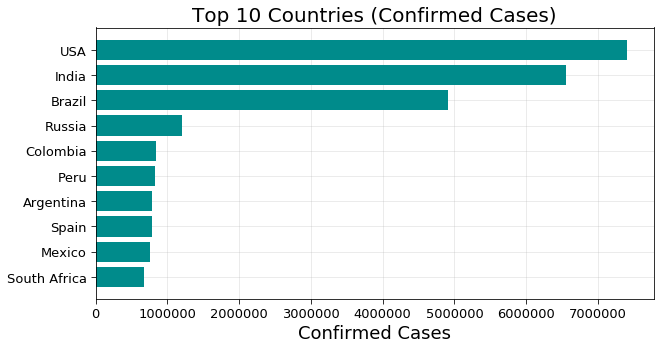

In [43]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-10:],df_countries_cases.sort_values('Confirmed')["Confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 Countries (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
plt.savefig(out+'Top 10 Countries (Confirmed Cases).png')

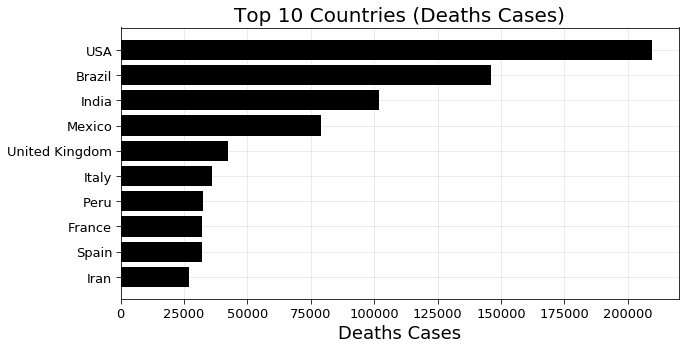

In [45]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Deaths')["Deaths"].index[-10:],df_countries_cases.sort_values('Deaths')["Deaths"].values[-10:],color="black")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths Cases",fontsize=18)
plt.title("Top 10 Countries (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig(out+'Top 10 Countries (Deaths Cases).png')

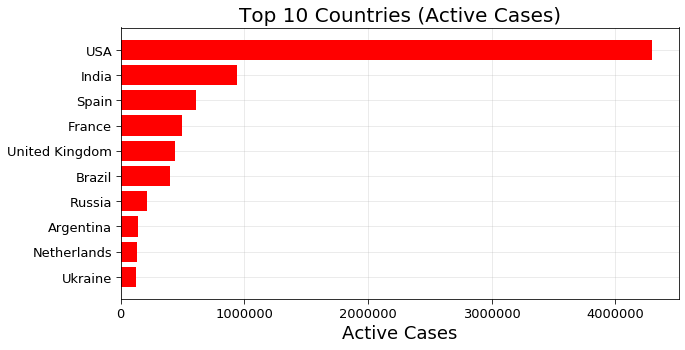

In [47]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Active')["Active"].index[-10:],df_countries_cases.sort_values('Active')["Active"].values[-10:],color="red")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Active Cases",fontsize=18)
plt.title("Top 10 Countries (Active Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig(out+'Top 10 Countries (Active Cases).png')

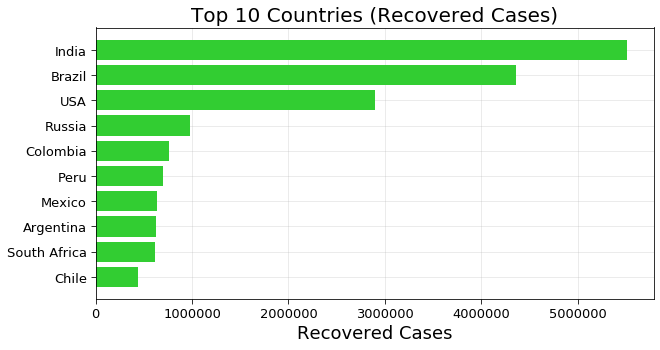

In [48]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Recovered')["Recovered"].index[-10:],df_countries_cases.sort_values('Recovered')["Recovered"].values[-10:],color="limegreen")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Recovered Cases",fontsize=18)
plt.title("Top 10 Countries (Recovered Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig(out+'Top 10 Countries (Recovered Cases).png')

# Correlation Analysis
<hr>
Plotting Heat map of correlation of confirmed cases, recovered cases, deaths and active cases.

### Country wise Correlation

In [52]:
df_countries_cases.iloc[:,:].corr().style.background_gradient(cmap='Reds').format("{:.3f}")

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
Confirmed,1.000,0.932,0.937,0.807,0.257,0.025
Deaths,0.932,1.000,0.826,0.824,0.281,0.131
Recovered,0.937,0.826,1.000,0.550,0.235,0.011
Active,0.807,0.824,0.550,1.000,0.214,0.032
Incident_Rate,0.257,0.281,0.235,0.214,1.000,-0.064
Mortality Rate (per 100),0.025,0.131,0.011,0.032,-0.064,1.000


### Continent Wise Correlation

In [53]:
df_continents_cases.iloc[:,:].corr().style.background_gradient(cmap='Reds').format("{:.3f}")

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
Confirmed,1.000,0.892,0.930,0.644,0.721,0.142
Deaths,0.892,1.000,0.708,0.816,0.659,0.507
Recovered,0.930,0.708,1.000,0.317,0.657,-0.094
Active,0.644,0.816,0.317,1.000,0.475,0.533
Incident_Rate,0.721,0.659,0.657,0.475,1.000,0.280
Mortality Rate (per 100),0.142,0.507,-0.094,0.533,0.280,1.000


# Visualization on Map
<hr>

In [54]:
world_map = folium.Map(location=[10,0], tiles="cartodbpositron", zoom_start=2,max_zoom=6,min_zoom=2)
for i in range(0,len(df_confirmed)):
    folium.Circle(
        location=[df_confirmed.iloc[i]['Lat'], df_confirmed.iloc[i]['Long']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df_confirmed.iloc[i]['country']+"</h5>"+
                    "<div style='text-align:center;'>"+str(np.nan_to_num(df_confirmed.iloc[i]['state']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df_confirmed.iloc[i,-1])+"</li>"+
        "<li>Deaths:   "+str(df_deaths.iloc[i,-1])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df_deaths.iloc[i,-1]/(df_confirmed.iloc[i,-1]+1.00001)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=(int((np.log(df_confirmed.iloc[i,-1]+1.00001)))+0.2)*50000,
        color='#ff6600',
        fill_color='#ff8533',
        fill=True).add_to(world_map)

world_map


## Global Confirmed Cases Heat Map 
<hr>

In [58]:
temp_df = pd.DataFrame(df_countries_cases['Confirmed'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df["Confirmed"]), # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    hover_data=["Confirmed"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Confirmed Cases Heat Map (Log Scale)")
fig.update_coloraxes(colorbar_title="Confirmed Cases(Log Scale)",colorscale="Blues")
# fig.to_image("Global Heat Map confirmed.png")
fig.show()

## Global Deaths Heat Map 
<hr>

In [59]:
temp_df = pd.DataFrame(df_countries_cases['Deaths'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df["Deaths"]+1), # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    hover_data=["Deaths"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Deaths Heat Map (Log Scale)")
fig.update_coloraxes(colorbar_title="Deaths (Log Scale)",colorscale="Reds")
# fig.to_image("Global Heat Map deaths.png")
fig.show()

## Global Recovered Heat Map 
<hr>

In [60]:
temp_df = pd.DataFrame(df_countries_cases['Recovered'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df.iloc[:,-1]+1), # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    hover_data=["Recovered"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Recovered Heat Map (Log Scale)")
fig.update_coloraxes(colorbar_title="Recovered",colorscale="Greens")
# fig.to_image("Global Heat Map deaths.png")
fig.show()

## COVID-19: Spread Progression

In [61]:
df_data = df_table.groupby(['Last_Update', 'Country_Region'])['Confirmed', 'Deaths'].max().reset_index().fillna(0)
df_data["Last_Update"] = pd.to_datetime( df_data["Last_Update"]).dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(df_data, locations="Country_Region", locationmode='country names', 
                     color=np.power(df_data["Confirmed"],0.3)-2 , size= np.power(df_data["Confirmed"]+1,0.3)-1, hover_name="Country_Region",
                     hover_data=["Confirmed"],
                     range_color= [0, max(np.power(df_data["Confirmed"],0.3))], 
                     projection="natural earth", animation_frame="Last_Update", 
                     color_continuous_scale=px.colors.sequential.Plasma,
                     title='COVID-19: Progression of spread'
                    )
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.show()

# COVID-19 Spread Analysis
<hr>

Spread Analysis is in two sections 
1. Spread Across Globe
2. Spread Trends in the World, Continents and few most affected Countries

## 1. Spread Across Globe 
<hr> 
### Number of countries affected over the time

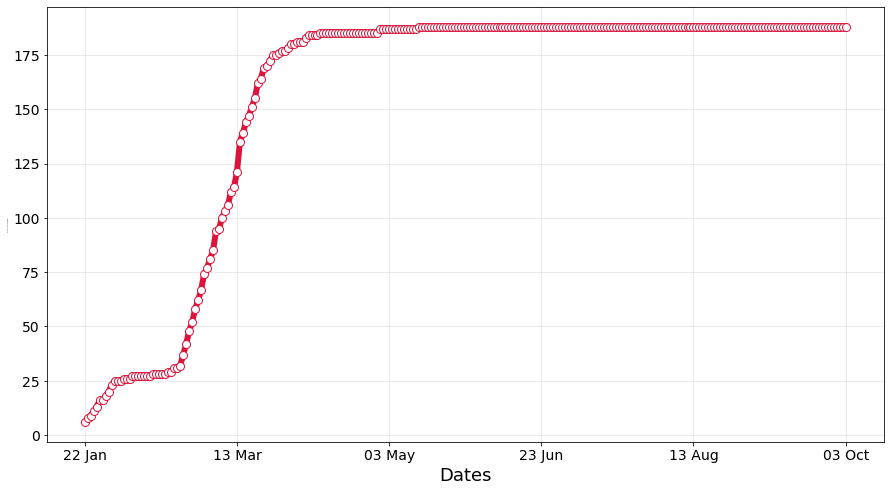

In [62]:
case_nums_country = df_confirmed.groupby("country").sum().drop(['Lat','Long'],axis =1).apply(lambda x: x[x > 0].count(), axis =0)
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]

f = plt.figure(figsize=(15,8))
f.add_subplot(111)
marker_style = dict(c="crimson",linewidth=6, linestyle='-', marker='o',markersize=8, markerfacecolor='#ffffff')
plt.plot(d, case_nums_country,**marker_style)
plt.tick_params(labelsize = 14)
plt.xticks(list(np.arange(0,len(d),int(len(d)/5))),d[:-1:int(len(d)/5)]+[d[-1]])

#labels
plt.xlabel("Dates",fontsize=18)
plt.ylabel("Number of Countries/Regions",fontsize=1)
plt.grid(alpha = 0.3)

plt.savefig(out+'spread.png')
plt.show()
plt.close()

##  2. Spread Trends in the World, Continents and few most affected Countries
<hr>
1. COVID-19 Global Spread Trends. 

2. COVID-19 Spread Trends in Different Continents

3. COVID-19 Spread Trends in Few Most Affected Countries

4. COVID-19 Spread Comparison of few most affected countries 

5. COVID-19 Spread Comparison of in different continents


### 1. COVID-19 Global Spread Trends
<h>
This graph shows the confirmed, deaths, recovered and active caes trends over the world.


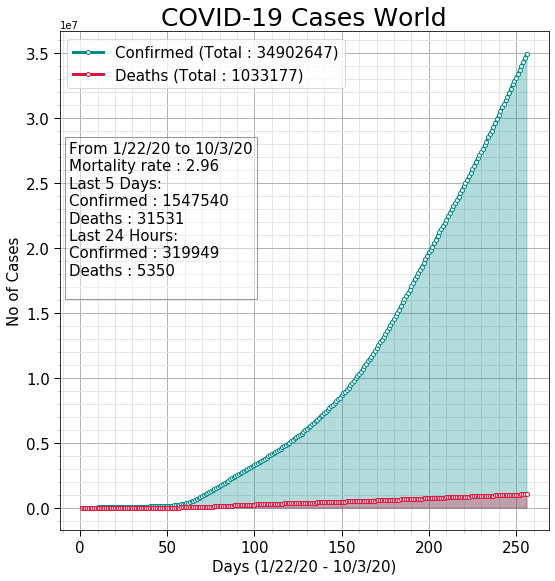

In [64]:
cols = 1
rows = 1
f = plt.figure(figsize=(10,10*rows))

visualize_covid_cases(df_confirmed, df_deaths,continent = "All",figure = [f,rows,cols, 1])

plt.savefig(out+'COIVD-19-World.png')
plt.show()

### 2 . COVID-19 Spread Trends in Different Continents

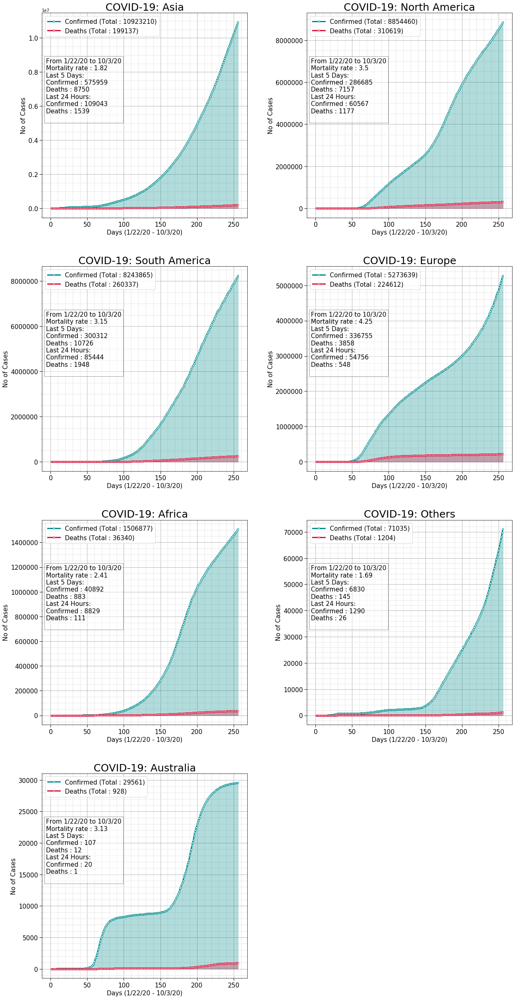

In [65]:
df_continents= df_confirmed.groupby(["continent"]).sum()
continents = df_continents.sort_values(df_continents.columns[-1],ascending = False).index

cols =2
rows = int(np.ceil(continents.shape[0]/cols))
f = plt.figure(figsize=(20,9*rows))
for i,continent in enumerate(continents):
    visualize_covid_cases(df_confirmed, df_deaths, continent = continent,figure = [f,rows,cols, i+1])

plt.show()

### 3. COVID-19 Spread Trends in Few Most Affected Countries

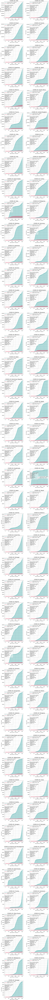

In [66]:
df_countries = df_confirmed.groupby(["country"]).sum()
df_countries = df_countries.sort_values(df_countries.columns[-1],ascending = False)
countries = df_countries[df_countries[df_countries.columns[-1]] >= 15000].index

cols =2
rows = int(np.ceil(countries.shape[0]/cols))
f = plt.figure(figsize=(18,7*rows))
for i,country in enumerate(countries):
    visualize_covid_cases(df_confirmed, df_deaths,country = country,figure = [f,rows,cols, i+1])

plt.show()

# ### 4. COVID-19 Spread Comparison of few most affected countries and INDIA in First 60 days

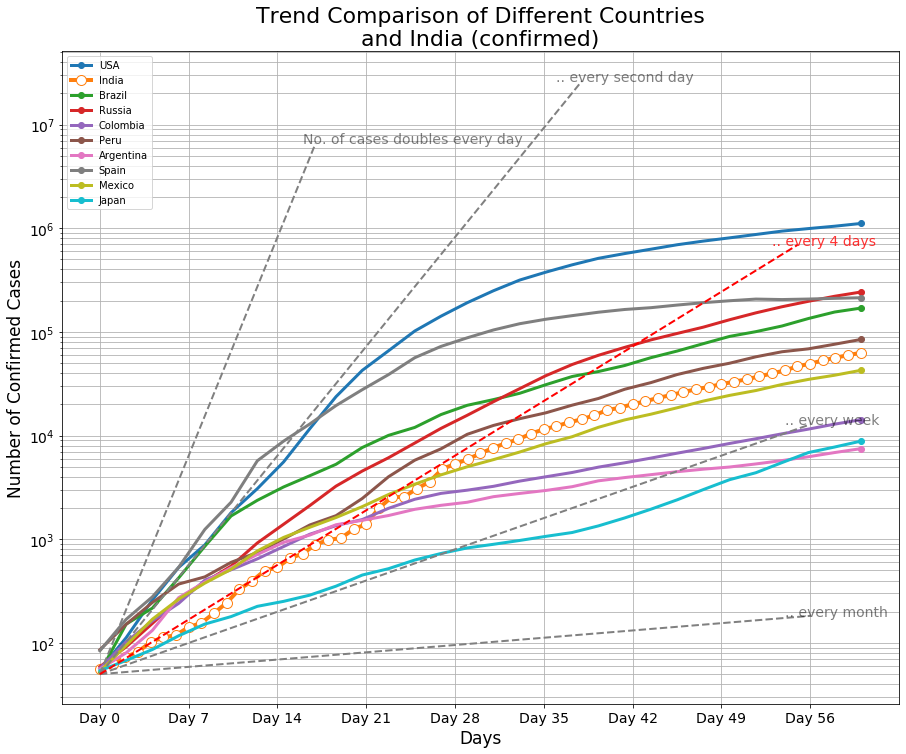

In [67]:
temp = df_confirmed.groupby('country').sum().drop(["Lat","Long"],axis =1).sort_values(df_confirmed.columns[-1], ascending= False)

threshold = 50
f = plt.figure(figsize=(15,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i >= 9:
        if country != "India" and country != "Japan" :
            continue
    days = 61
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:days]
     
    date = np.arange(0,len(t[:days]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k=1)  # type: BSpline
    power_smooth = spl(xnew)
    if country != "India":
        plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])
    else:
        marker_style = dict(linewidth=4, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')
        plt.plot(date,t,"-.",label = country,**marker_style)

plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,days,7),[ "Day "+str(i) for i in range(days)][::7])     

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-22))
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every second day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-4))
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-4))
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)


# India is following trend similar to doulbe the cases in 4 days but it may increase the rate 
x = np.arange(0,int(days-5))
y = 2**(x/4+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "Red")
plt.annotate(".. every 4 days",(x[-3],y[-1]),color="Red",xycoords="data",fontsize=14,alpha = 0.8)

# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Confirmed Cases",fontsize=17)
plt.title("Trend Comparison of Different Countries\n and India (confirmed) ",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.savefig(out+'Trend Comparison with India (confirmed).png')
plt.show()

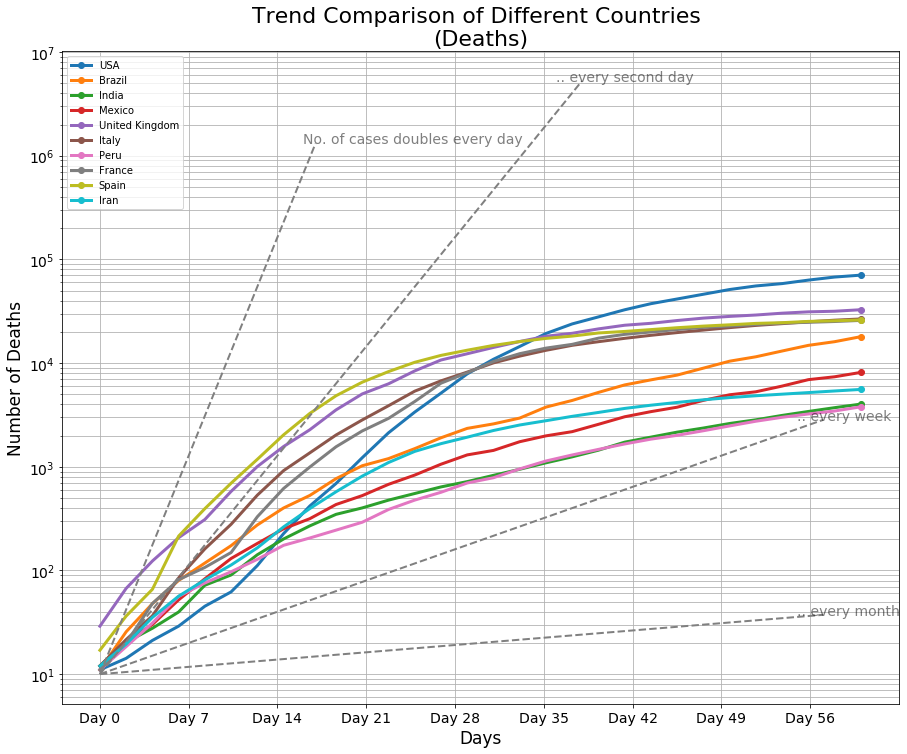

In [68]:
temp = df_deaths.groupby('country').sum().drop(["Lat","Long"],axis =1).sort_values(df_deaths.columns[-1], ascending= False)

threshold = 10
f = plt.figure(figsize=(15,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i >= 10:
        break
    days = 61
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:days]
     
    date = np.arange(0,len(t[:days]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k=1)  # type: BSpline
    power_smooth = spl(xnew)
    plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])


plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,days,7),[ "Day "+str(i) for i in range(days)][::7])     

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-22)
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every second day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-3)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-3)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Deaths",fontsize=17)
plt.title("Trend Comparison of Different Countries \n(Deaths)",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.savefig(out+'Trend Comparison countries deaths.png')
plt.show()

### 5. COVID-19 Spread Comparison of in different continents

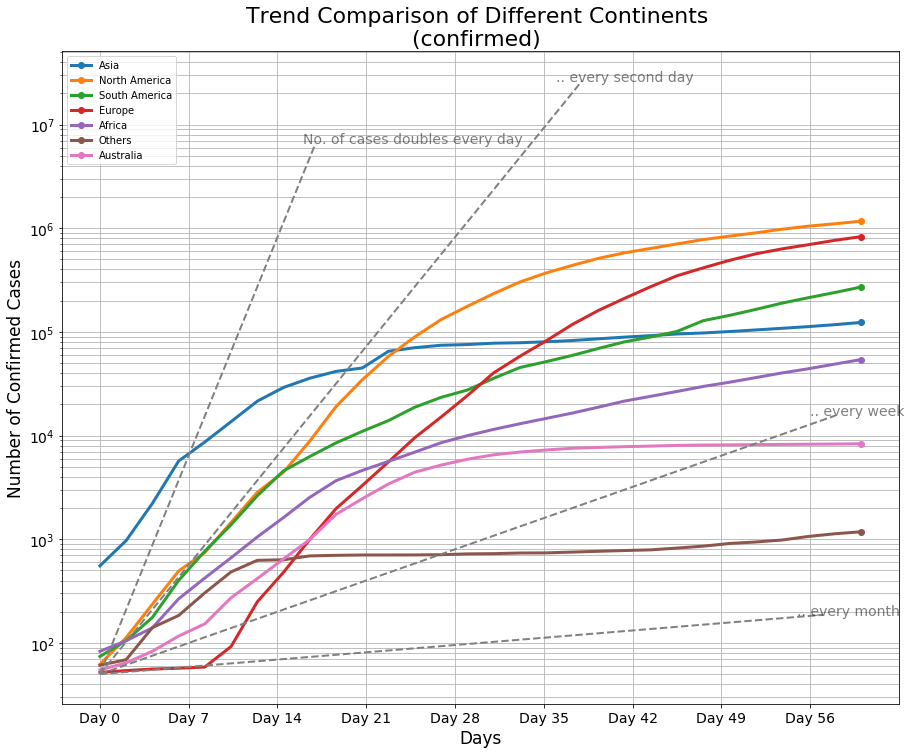

In [69]:
temp = df_confirmed.groupby('continent').sum().drop(["Lat","Long"],axis =1).sort_values(df_confirmed.columns[-1], ascending= False)

threshold = 50
f = plt.figure(figsize=(15,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i >= 10:
        break
    days = 61
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:days]
     
    date = np.arange(0,len(t[:days]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k=1)  # type: BSpline
    power_smooth = spl(xnew)
    plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])

plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,days,7),[ "Day "+str(i) for i in range(days)][::7])     

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-22)
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every second day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-2)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-3)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)


# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Confirmed Cases",fontsize=17)
plt.title("Trend Comparison of Different Continents \n(confirmed) ",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.savefig(out+'Trend Comparison of continents (Confirmed).png')
plt.show()

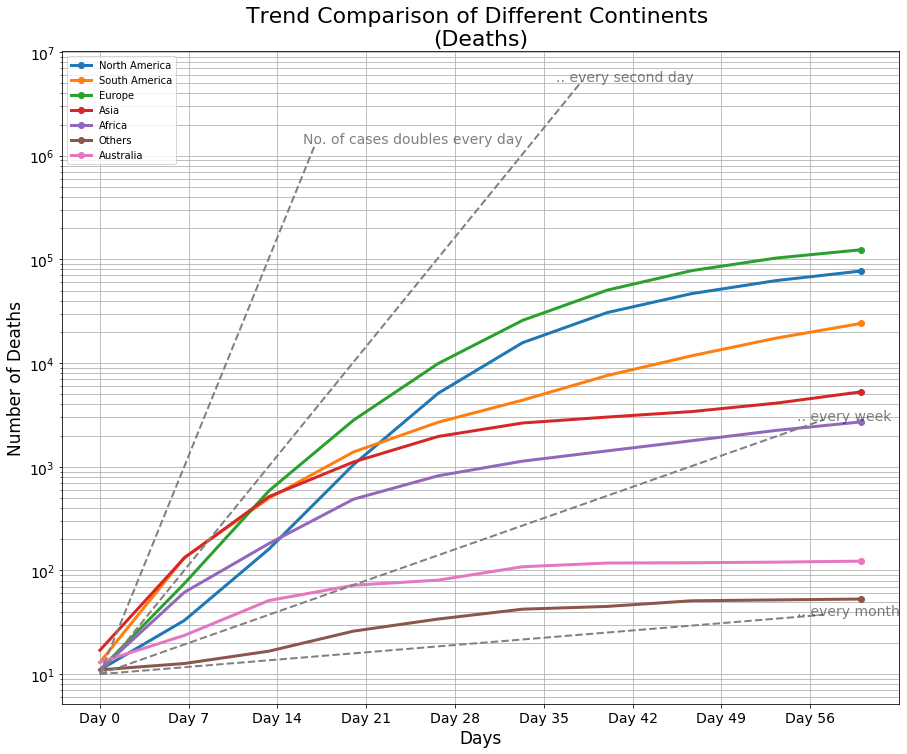

In [70]:
temp = df_deaths.groupby('continent').sum().drop(["Lat","Long"],axis =1).sort_values(df_deaths.columns[-1], ascending= False)

threshold = 10
f = plt.figure(figsize=(15,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i >= 10:
        break
    days = 61
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:days]
     
    date = np.arange(0,len(t[:days]))
    xnew = np.linspace(date.min(), date.max(), 10)
    spl = make_interp_spline(date, t, k=1)  # type: BSpline
    power_smooth = spl(xnew)
    plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])


plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,days,7),[ "Day "+str(i) for i in range(days)][::7])     

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-22)
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every second day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-3)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-3)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Deaths",fontsize=17)
plt.title("Trend Comparison of Different Continents \n(Deaths)",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.savefig(out+'Trend Comparison continents (deaths).png')
plt.show()

# Global trend prediction

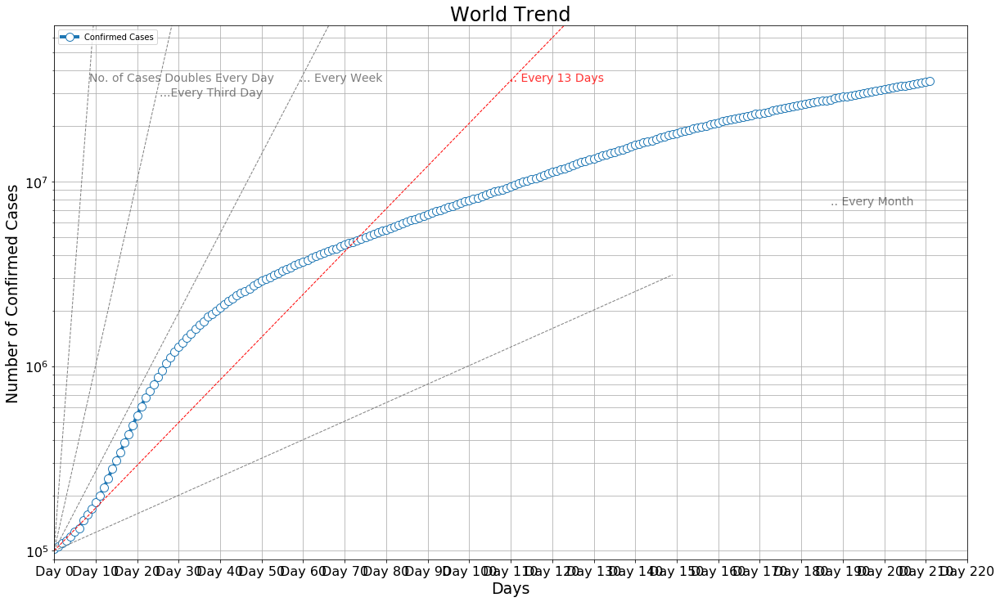

In [71]:
temp_data = df_confirmed.iloc[:,5:].sum(axis =0)
f = plt.figure(figsize=(20,12))
f.add_subplot(111)

threshold = 100000

t = temp_data.values
t = t[t >threshold]

date = np.arange(0,len(t[:]))
xnew = np.linspace(date.min(), date.max(), 10)
spl = make_interp_spline(date, t, k=1)  # type: BSpline
power_smooth = spl(xnew)

marker_style = dict(linewidth=4, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')
plt.plot(date,t,"-.",label="Confirmed Cases",**marker_style)

days  = 150
# Reference lines 
x = np.arange(0,days)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =1,color = "gray")
plt.annotate("No. of Cases Doubles Every Day",(np.log2((t.max()-threshold)/threshold),t.max()-threshold/2),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days)
y = 2**(x/3+np.log2(threshold))
plt.plot(x,y,"--",linewidth =1,color = "gray")
plt.annotate("...Every Third Day",(np.log2((t.max()-threshold)/threshold)*3,(t.max()/1.2)-threshold/2),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =1,color = "gray")
plt.annotate("... Every Week",(np.log2((t.max()-threshold)/threshold)*7,t.max()-threshold),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =1,color = "gray")
plt.annotate(".. Every Month",(len(t)-25,2**((len(t)-25)/30+np.log2(threshold))),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days)
y = 2**(x/13+np.log2(threshold))
plt.plot(x,y,"--",linewidth =1,color = "Red")
plt.annotate(".. Every 13 Days",(np.log2((t.max()-threshold)/threshold)*13,t.max()-threshold),color="Red",xycoords="data",fontsize=14,alpha = 0.8)


plt.xlim(date[0],date[-1])
plt.ylim(threshold - threshold/10,2*t.max())
# plot Params
# plt.tight_layout()
plt.tick_params(labelsize = 16)        
plt.xticks(np.arange(0,len(t[:])+10,10),[ "Day "+str(i) for i in range(len(t[:])+10)][::10]) 
plt.xlabel("Days",fontsize=19)
plt.ylabel("Number of Confirmed Cases",fontsize=19)
plt.title("World Trend",fontsize=24)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.savefig(out+"World Trend Confirmed cases.png")
plt.show()

In [72]:
Visible = Input(shape=(1,))
Dense_l1 = Dense(80,name="Dense_l1")(Visible)
LRelu_l1 = LeakyReLU(name = "LRelu_l1")(Dense_l1)

Dense_l2 = Dense(80,name = "Dense_l2")(LRelu_l1)
LRelu_l2 = LeakyReLU(name = "LRelu_l2")(Dense_l2)

Dense_l3 = Dense(80,name = "Dense_l3")(LRelu_l2)
LRelu_l3 = LeakyReLU(name = "LRelu_l3")(Dense_l3)

Dense_l4 = Dense(1,name="Dense_l4")(LRelu_l3)
LRelu_l4 = LeakyReLU(name = "Output")(Dense_l4
                                     )
model = models.Model(inputs=Visible, outputs=LRelu_l4)
model.compile(optimizer=Adam(lr=0.001), 
              loss='mean_squared_error',
              metrics=['accuracy'])
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l3 (LeakyReLU)         (None, 80)                0   

In [73]:
data_y = np.log10(np.asarray(df_confirmed.iloc[:,5:].sum(axis =0)).astype("float32"))
data_x = np.arange(1,len(data_y)+1)

In [74]:
epochs = 1000
model.fit(data_x.reshape([data_y.shape[0],1]),data_y.reshape([data_y.shape[0],1]),epochs=epochs)

W1004 21:28:33.634951  8520 deprecation_wrapper.py:119] From c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\keras\backend\tensorflow_backend.py:422: The name tf.global_variables is deprecated. Please use tf.compat.v1.global_variables instead.



Epoch 1/1000
256/256 [==============================] - 1s 3ms/step - loss: 60.2961 - accuracy: 0.0000e+00
Epoch 2/1000
256/256 [==============================] - 0s 74us/step - loss: 30.0518 - accuracy: 0.0000e+00
Epoch 3/1000
256/256 [==============================] - 0s 62us/step - loss: 13.8317 - accuracy: 0.0000e+00
Epoch 4/1000
256/256 [==============================] - 0s 70us/step - loss: 10.5865 - accuracy: 0.0000e+00
Epoch 5/1000
256/256 [==============================] - 0s 55us/step - loss: 8.1295 - accuracy: 0.0000e+00
Epoch 6/1000
256/256 [==============================] - 0s 62us/step - loss: 5.7770 - accuracy: 0.0000e+00
Epoch 7/1000
256/256 [==============================] - 0s 66us/step - loss: 5.8560 - accuracy: 0.0000e+00
Epoch 8/1000
256/256 [==============================] - 0s 62us/step - loss: 5.0988 - accuracy: 0.0000e+00
Epoch 9/1000
256/256 [==============================] - 0s 62us/step - loss: 4.9772 - accuracy: 0.0000e+00
Epoch 10/1000
256/256 [===========

256/256 [==============================] - 0s 55us/step - loss: 0.3885 - accuracy: 0.0000e+00
Epoch 77/1000
256/256 [==============================] - 0s 55us/step - loss: 0.3478 - accuracy: 0.0000e+00
Epoch 78/1000
256/256 [==============================] - 0s 55us/step - loss: 0.2695 - accuracy: 0.0000e+00
Epoch 79/1000
256/256 [==============================] - 0s 51us/step - loss: 0.2046 - accuracy: 0.0000e+00
Epoch 80/1000
256/256 [==============================] - 0s 55us/step - loss: 0.3457 - accuracy: 0.0000e+00
Epoch 81/1000
256/256 [==============================] - 0s 51us/step - loss: 0.2172 - accuracy: 0.0000e+00
Epoch 82/1000
256/256 [==============================] - 0s 55us/step - loss: 0.2566 - accuracy: 0.0000e+00
Epoch 83/1000
256/256 [==============================] - 0s 55us/step - loss: 0.3773 - accuracy: 0.0000e+00
Epoch 84/1000
256/256 [==============================] - 0s 47us/step - loss: 0.3254 - accuracy: 0.0000e+00
Epoch 85/1000
256/256 [===================

256/256 [==============================] - 0s 78us/step - loss: 0.1824 - accuracy: 0.0000e+00
Epoch 152/1000
256/256 [==============================] - 0s 70us/step - loss: 0.1445 - accuracy: 0.0000e+00
Epoch 153/1000
256/256 [==============================] - 0s 74us/step - loss: 0.1327 - accuracy: 0.0000e+00
Epoch 154/1000
256/256 [==============================] - 0s 78us/step - loss: 0.1139 - accuracy: 0.0000e+00
Epoch 155/1000
256/256 [==============================] - 0s 82us/step - loss: 0.1268 - accuracy: 0.0000e+00
Epoch 156/1000
256/256 [==============================] - 0s 82us/step - loss: 0.1295 - accuracy: 0.0000e+00
Epoch 157/1000
256/256 [==============================] - 0s 86us/step - loss: 0.1272 - accuracy: 0.0000e+00
Epoch 158/1000
256/256 [==============================] - 0s 93us/step - loss: 0.0904 - accuracy: 0.0000e+00
Epoch 159/1000
256/256 [==============================] - 0s 78us/step - loss: 0.1391 - accuracy: 0.0000e+00
Epoch 160/1000
256/256 [==========

256/256 [==============================] - 0s 70us/step - loss: 0.0967 - accuracy: 0.0000e+00
Epoch 227/1000
256/256 [==============================] - 0s 66us/step - loss: 0.0483 - accuracy: 0.0000e+00
Epoch 228/1000
256/256 [==============================] - 0s 70us/step - loss: 0.0496 - accuracy: 0.0000e+00
Epoch 229/1000
256/256 [==============================] - 0s 74us/step - loss: 0.1352 - accuracy: 0.0000e+00
Epoch 230/1000
256/256 [==============================] - 0s 70us/step - loss: 0.1869 - accuracy: 0.0000e+00
Epoch 231/1000
256/256 [==============================] - 0s 74us/step - loss: 0.3560 - accuracy: 0.0000e+00
Epoch 232/1000
256/256 [==============================] - 0s 66us/step - loss: 0.3075 - accuracy: 0.0000e+00
Epoch 233/1000
256/256 [==============================] - 0s 58us/step - loss: 0.1048 - accuracy: 0.0000e+00
Epoch 234/1000
256/256 [==============================] - 0s 47us/step - loss: 0.0653 - accuracy: 0.0000e+00
Epoch 235/1000
256/256 [==========

256/256 [==============================] - 0s 47us/step - loss: 0.0431 - accuracy: 0.0000e+00
Epoch 302/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0481 - accuracy: 0.0000e+00
Epoch 303/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0398 - accuracy: 0.0000e+00
Epoch 304/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0318 - accuracy: 0.0000e+00
Epoch 305/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0589 - accuracy: 0.0000e+00
Epoch 306/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0498 - accuracy: 0.0000e+00
Epoch 307/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0519 - accuracy: 0.0000e+00
Epoch 308/1000
256/256 [==============================] - 0s 47us/step - loss: 0.0719 - accuracy: 0.0000e+00
Epoch 309/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0506 - accuracy: 0.0000e+00
Epoch 310/1000
256/256 [==========

256/256 [==============================] - 0s 47us/step - loss: 0.0288 - accuracy: 0.0000e+00
Epoch 377/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0264 - accuracy: 0.0000e+00
Epoch 378/1000
256/256 [==============================] - 0s 47us/step - loss: 0.0674 - accuracy: 0.0000e+00
Epoch 379/1000
256/256 [==============================] - 0s 47us/step - loss: 0.0922 - accuracy: 0.0000e+00
Epoch 380/1000
256/256 [==============================] - 0s 47us/step - loss: 0.1773 - accuracy: 0.0000e+00
Epoch 381/1000
256/256 [==============================] - 0s 47us/step - loss: 0.2879 - accuracy: 0.0000e+00
Epoch 382/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0806 - accuracy: 0.0000e+00
Epoch 383/1000
256/256 [==============================] - 0s 58us/step - loss: 0.0214 - accuracy: 0.0000e+00
Epoch 384/1000
256/256 [==============================] - 0s 58us/step - loss: 0.0303 - accuracy: 0.0000e+00
Epoch 385/1000
256/256 [==========

256/256 [==============================] - 0s 70us/step - loss: 0.0304 - accuracy: 0.0000e+00
Epoch 451/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0396 - accuracy: 0.0000e+00
Epoch 452/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0827 - accuracy: 0.0000e+00
Epoch 453/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0881 - accuracy: 0.0000e+00
Epoch 454/1000
256/256 [==============================] - 0s 70us/step - loss: 0.0297 - accuracy: 0.0000e+00
Epoch 455/1000
256/256 [==============================] - 0s 109us/step - loss: 0.0213 - accuracy: 0.0000e+00
Epoch 456/1000
256/256 [==============================] - 0s 129us/step - loss: 0.0287 - accuracy: 0.0000e+00
Epoch 457/1000
256/256 [==============================] - 0s 70us/step - loss: 0.0599 - accuracy: 0.0000e+00
Epoch 458/1000
256/256 [==============================] - 0s 113us/step - loss: 0.0925 - accuracy: 0.0000e+00
Epoch 459/1000
256/256 [=======

256/256 [==============================] - 0s 58us/step - loss: 0.0320 - accuracy: 0.0000e+00
Epoch 526/1000
256/256 [==============================] - 0s 86us/step - loss: 0.0365 - accuracy: 0.0000e+00
Epoch 527/1000
256/256 [==============================] - 0s 78us/step - loss: 0.0272 - accuracy: 0.0000e+00
Epoch 528/1000
256/256 [==============================] - 0s 90us/step - loss: 0.0149 - accuracy: 0.0000e+00
Epoch 529/1000
256/256 [==============================] - 0s 70us/step - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 530/1000
256/256 [==============================] - 0s 78us/step - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 531/1000
256/256 [==============================] - 0s 82us/step - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 532/1000
256/256 [==============================] - 0s 82us/step - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 533/1000
256/256 [==============================] - 0s 74us/step - loss: 0.0235 - accuracy: 0.0000e+00
Epoch 534/1000
256/256 [==========

256/256 [==============================] - 0s 51us/step - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 600/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 601/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 602/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 603/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 604/1000
256/256 [==============================] - 0s 54us/step - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 605/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 606/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0267 - accuracy: 0.0000e+00
Epoch 607/1000
256/256 [==============================] - 0s 47us/step - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 608/1000
256/256 [==========

256/256 [==============================] - 0s 58us/step - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 675/1000
256/256 [==============================] - 0s 58us/step - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 676/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 677/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 678/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 679/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0268 - accuracy: 0.0000e+00
Epoch 680/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0782 - accuracy: 0.0000e+00
Epoch 681/1000
256/256 [==============================] - 0s 51us/step - loss: 0.1318 - accuracy: 0.0000e+00
Epoch 682/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0940 - accuracy: 0.0000e+00
Epoch 683/1000
256/256 [==========

256/256 [==============================] - 0s 43us/step - loss: 0.0986 - accuracy: 0.0000e+00
Epoch 749/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0947 - accuracy: 0.0000e+00
Epoch 750/1000
256/256 [==============================] - 0s 58us/step - loss: 0.0728 - accuracy: 0.0000e+00
Epoch 751/1000
256/256 [==============================] - 0s 58us/step - loss: 0.3036 - accuracy: 0.0000e+00
Epoch 752/1000
256/256 [==============================] - 0s 58us/step - loss: 0.5338 - accuracy: 0.0000e+00
Epoch 753/1000
256/256 [==============================] - 0s 51us/step - loss: 0.5602 - accuracy: 0.0000e+00
Epoch 754/1000
256/256 [==============================] - 0s 55us/step - loss: 0.5386 - accuracy: 0.0000e+00
Epoch 755/1000
256/256 [==============================] - 0s 55us/step - loss: 0.3619 - accuracy: 0.0000e+00
Epoch 756/1000
256/256 [==============================] - 0s 51us/step - loss: 0.5145 - accuracy: 0.0000e+00
Epoch 757/1000
256/256 [==========

256/256 [==============================] - 0s 43us/step - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 824/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 825/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 826/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 827/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 828/1000
256/256 [==============================] - 0s 58us/step - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 829/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 830/1000
256/256 [==============================] - 0s 58us/step - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 831/1000
256/256 [==============================] - 0s 58us/step - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 832/1000
256/256 [==========

256/256 [==============================] - 0s 55us/step - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 899/1000
256/256 [==============================] - 0s 47us/step - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 900/1000
256/256 [==============================] - 0s 47us/step - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 901/1000
256/256 [==============================] - 0s 58us/step - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 902/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 903/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 904/1000
256/256 [==============================] - 0s 51us/step - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 905/1000
256/256 [==============================] - 0s 58us/step - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 906/1000
256/256 [==============================] - 0s 55us/step - loss: 0.0168 - accuracy: 0.0000e+00
Epoch 907/1000
256/256 [==========

256/256 [==============================] - 0s 62us/step - loss: 0.0755 - accuracy: 0.0000e+00
Epoch 974/1000
256/256 [==============================] - 0s 70us/step - loss: 0.1511 - accuracy: 0.0000e+00
Epoch 975/1000
256/256 [==============================] - 0s 62us/step - loss: 0.1386 - accuracy: 0.0000e+00
Epoch 976/1000
256/256 [==============================] - 0s 66us/step - loss: 0.0172 - accuracy: 0.0000e+00
Epoch 977/1000
256/256 [==============================] - 0s 70us/step - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 978/1000
256/256 [==============================] - 0s 74us/step - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 979/1000
256/256 [==============================] - 0s 58us/step - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 980/1000
256/256 [==============================] - 0s 62us/step - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 981/1000
256/256 [==============================] - 0s 66us/step - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 982/1000
256/256 [==========

In [75]:
model.save('model_confirmed_v4.h5')

In [76]:
model = models.load_model("model_confirmed_v4.h5")
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l3 (LeakyReLU)         (None, 80)                0   

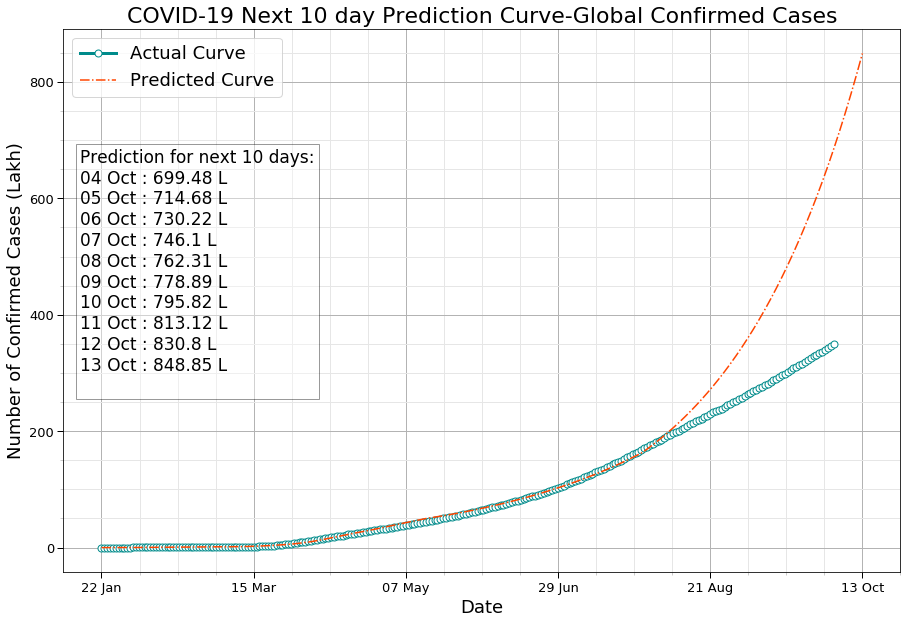

In [79]:
lakh = 100000
prediction_days = 10

temp_data = df_confirmed.iloc[:,5:].sum(axis =0)
data = np.power(10,model.predict(np.arange(1,len(temp_data)+prediction_days+1)))
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)

date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data/lakh,"-.",color="darkcyan",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data/lakh,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total = d + nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-3)[0]/lakh)+" L\n"

plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("COVID-19 Next 10 day Prediction Curve-Global Confirmed Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Confirmed Cases (Lakh)",fontsize =18)

# plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.savefig(out+"Prediction Curve-Confirmed.png")
plt.show()

## Prediction Curve for Global Death Cases
Buliding Model

In [80]:
Visible = Input(shape=(1,))
Dense_l1 = Dense(80,name="Dense_l1")(Visible)
LRelu_l1 = LeakyReLU(name = "LRelu_l1")(Dense_l1)
Drop1 = Dropout(0.25)(LRelu_l1)

Dense_l2 = Dense(80,name = "Dense_l2")(Drop1)
LRelu_l2 = LeakyReLU(name = "LRelu_l2")(Dense_l2)
Drop2 = Dropout(0.3)(LRelu_l2)

Dense_l3 = Dense(80,name = "Dense_l3")(Drop2)
LRelu_l3 = LeakyReLU(name = "LRelu_l3")(Dense_l3)
Drop3 = Dropout(0.4)(LRelu_l3)

Dense_l4 = Dense(1,name="Dense_l4")(Drop3)
LRelu_l4 = LeakyReLU(name = "Output")(Dense_l4)

model2 = models.Model(inputs=Visible, outputs=LRelu_l4)
model2.compile(optimizer=Adam(lr=0.0001), 
              loss='mean_squared_error')
model2.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 80)                0   

In [81]:
data1_y = np.log10(np.asarray(df_deaths.iloc[:,5:].sum(axis =0)).astype("float32"))
data1_x = np.arange(1,len(data1_y)+1)

In [82]:
epochs= 1000
model2.fit(data1_x.reshape([data1_y.shape[0],1]),data1_y.reshape([data1_y.shape[0],1]),epochs=epochs)

Epoch 1/1000
256/256 [==============================] - 1s 2ms/step - loss: 113.1877
Epoch 2/1000
256/256 [==============================] - 0s 113us/step - loss: 83.9236
Epoch 3/1000
256/256 [==============================] - 0s 93us/step - loss: 91.2415
Epoch 4/1000
256/256 [==============================] - 0s 97us/step - loss: 72.9134
Epoch 5/1000
256/256 [==============================] - 0s 93us/step - loss: 75.3651
Epoch 6/1000
256/256 [==============================] - 0s 101us/step - loss: 68.3921
Epoch 7/1000
256/256 [==============================] - 0s 74us/step - loss: 70.3883
Epoch 8/1000
256/256 [==============================] - 0s 74us/step - loss: 80.3958
Epoch 9/1000
256/256 [==============================] - 0s 70us/step - loss: 62.7825
Epoch 10/1000
256/256 [==============================] - 0s 78us/step - loss: 77.4032
Epoch 11/1000
256/256 [==============================] - 0s 78us/step - loss: 68.0336
Epoch 12/1000
256/256 [==============================] - 0s 7

256/256 [==============================] - 0s 70us/step - loss: 19.0933
Epoch 96/1000
256/256 [==============================] - 0s 66us/step - loss: 21.6332
Epoch 97/1000
256/256 [==============================] - 0s 74us/step - loss: 18.8430
Epoch 98/1000
256/256 [==============================] - 0s 66us/step - loss: 20.6957
Epoch 99/1000
256/256 [==============================] - 0s 62us/step - loss: 18.8347
Epoch 100/1000
256/256 [==============================] - 0s 66us/step - loss: 19.4120
Epoch 101/1000
256/256 [==============================] - 0s 62us/step - loss: 20.6199
Epoch 102/1000
256/256 [==============================] - 0s 62us/step - loss: 19.0388
Epoch 103/1000
256/256 [==============================] - 0s 66us/step - loss: 20.0905
Epoch 104/1000
256/256 [==============================] - 0s 66us/step - loss: 19.0593
Epoch 105/1000
256/256 [==============================] - 0s 62us/step - loss: 20.1045
Epoch 106/1000
256/256 [==============================] - 0s 6

256/256 [==============================] - 0s 66us/step - loss: 13.8658
Epoch 190/1000
256/256 [==============================] - 0s 66us/step - loss: 13.5693
Epoch 191/1000
256/256 [==============================] - 0s 66us/step - loss: 13.2477
Epoch 192/1000
256/256 [==============================] - 0s 70us/step - loss: 12.5351
Epoch 193/1000
256/256 [==============================] - 0s 66us/step - loss: 10.6197
Epoch 194/1000
256/256 [==============================] - 0s 62us/step - loss: 10.7236
Epoch 195/1000
256/256 [==============================] - 0s 66us/step - loss: 12.1379
Epoch 196/1000
256/256 [==============================] - 0s 70us/step - loss: 12.2059
Epoch 197/1000
256/256 [==============================] - 0s 66us/step - loss: 13.0977
Epoch 198/1000
256/256 [==============================] - 0s 74us/step - loss: 10.4954
Epoch 199/1000
256/256 [==============================] - 0s 66us/step - loss: 11.0989
Epoch 200/1000
256/256 [==============================] - 

256/256 [==============================] - 0s 70us/step - loss: 7.0494
Epoch 285/1000
256/256 [==============================] - 0s 62us/step - loss: 6.8721
Epoch 286/1000
256/256 [==============================] - 0s 62us/step - loss: 7.3682
Epoch 287/1000
256/256 [==============================] - 0s 58us/step - loss: 7.3013
Epoch 288/1000
256/256 [==============================] - 0s 62us/step - loss: 8.5397
Epoch 289/1000
256/256 [==============================] - 0s 66us/step - loss: 7.6755
Epoch 290/1000
256/256 [==============================] - 0s 66us/step - loss: 6.8977
Epoch 291/1000
256/256 [==============================] - 0s 66us/step - loss: 8.2833
Epoch 292/1000
256/256 [==============================] - ETA: 0s - loss: 7.656 - 0s 78us/step - loss: 6.2283
Epoch 293/1000
256/256 [==============================] - 0s 74us/step - loss: 6.0045
Epoch 294/1000
256/256 [==============================] - 0s 74us/step - loss: 5.9887
Epoch 295/1000
256/256 [=====================

256/256 [==============================] - 0s 70us/step - loss: 4.6036
Epoch 380/1000
256/256 [==============================] - 0s 74us/step - loss: 4.3465
Epoch 381/1000
256/256 [==============================] - 0s 90us/step - loss: 4.8222
Epoch 382/1000
256/256 [==============================] - 0s 82us/step - loss: 4.3266
Epoch 383/1000
256/256 [==============================] - 0s 78us/step - loss: 4.8489
Epoch 384/1000
256/256 [==============================] - 0s 74us/step - loss: 6.2676
Epoch 385/1000
256/256 [==============================] - 0s 74us/step - loss: 5.3298
Epoch 386/1000
256/256 [==============================] - 0s 70us/step - loss: 5.3151
Epoch 387/1000
256/256 [==============================] - 0s 70us/step - loss: 6.3926
Epoch 388/1000
256/256 [==============================] - 0s 70us/step - loss: 4.5814
Epoch 389/1000
256/256 [==============================] - 0s 70us/step - loss: 4.9698
Epoch 390/1000
256/256 [==============================] - 0s 66us/ste

256/256 [==============================] - 0s 70us/step - loss: 4.0800
Epoch 475/1000
256/256 [==============================] - 0s 70us/step - loss: 4.9390
Epoch 476/1000
256/256 [==============================] - 0s 74us/step - loss: 4.0686
Epoch 477/1000
256/256 [==============================] - 0s 66us/step - loss: 4.6579
Epoch 478/1000
256/256 [==============================] - 0s 97us/step - loss: 4.6686
Epoch 479/1000
256/256 [==============================] - 0s 121us/step - loss: 4.0035
Epoch 480/1000
256/256 [==============================] - 0s 129us/step - loss: 3.3818
Epoch 481/1000
256/256 [==============================] - 0s 90us/step - loss: 4.0818
Epoch 482/1000
256/256 [==============================] - 0s 179us/step - loss: 3.5895
Epoch 483/1000
256/256 [==============================] - 0s 78us/step - loss: 3.9368
Epoch 484/1000
256/256 [==============================] - 0s 82us/step - loss: 4.6458
Epoch 485/1000
256/256 [==============================] - 0s 97us/

256/256 [==============================] - 0s 78us/step - loss: 3.6386
Epoch 570/1000
256/256 [==============================] - 0s 70us/step - loss: 3.1775
Epoch 571/1000
256/256 [==============================] - 0s 62us/step - loss: 3.4433
Epoch 572/1000
256/256 [==============================] - 0s 66us/step - loss: 3.0846
Epoch 573/1000
256/256 [==============================] - 0s 74us/step - loss: 2.9259
Epoch 574/1000
256/256 [==============================] - 0s 66us/step - loss: 2.9966
Epoch 575/1000
256/256 [==============================] - 0s 70us/step - loss: 2.9855
Epoch 576/1000
256/256 [==============================] - 0s 66us/step - loss: 3.1170
Epoch 577/1000
256/256 [==============================] - 0s 74us/step - loss: 2.7244
Epoch 578/1000
256/256 [==============================] - 0s 66us/step - loss: 3.0941
Epoch 579/1000
256/256 [==============================] - 0s 109us/step - loss: 2.9710
Epoch 580/1000
256/256 [==============================] - 0s 94us/st

256/256 [==============================] - 0s 62us/step - loss: 2.2369
Epoch 665/1000
256/256 [==============================] - 0s 74us/step - loss: 2.3402
Epoch 666/1000
256/256 [==============================] - 0s 101us/step - loss: 2.0674
Epoch 667/1000
256/256 [==============================] - 0s 86us/step - loss: 2.1488
Epoch 668/1000
256/256 [==============================] - 0s 74us/step - loss: 2.6375
Epoch 669/1000
256/256 [==============================] - 0s 74us/step - loss: 2.4945
Epoch 670/1000
256/256 [==============================] - 0s 78us/step - loss: 2.2576
Epoch 671/1000
256/256 [==============================] - 0s 70us/step - loss: 2.2390
Epoch 672/1000
256/256 [==============================] - 0s 70us/step - loss: 2.4460
Epoch 673/1000
256/256 [==============================] - 0s 70us/step - loss: 2.0765
Epoch 674/1000
256/256 [==============================] - 0s 70us/step - loss: 2.3470
Epoch 675/1000
256/256 [==============================] - 0s 66us/st

256/256 [==============================] - 0s 70us/step - loss: 2.1978
Epoch 760/1000
256/256 [==============================] - 0s 62us/step - loss: 1.7819
Epoch 761/1000
256/256 [==============================] - 0s 58us/step - loss: 1.7832
Epoch 762/1000
256/256 [==============================] - 0s 66us/step - loss: 1.8288
Epoch 763/1000
256/256 [==============================] - 0s 62us/step - loss: 1.7894
Epoch 764/1000
256/256 [==============================] - 0s 62us/step - loss: 2.0792
Epoch 765/1000
256/256 [==============================] - 0s 66us/step - loss: 2.0052
Epoch 766/1000
256/256 [==============================] - 0s 62us/step - loss: 1.9660
Epoch 767/1000
256/256 [==============================] - 0s 66us/step - loss: 1.9045
Epoch 768/1000
256/256 [==============================] - 0s 62us/step - loss: 1.8485
Epoch 769/1000
256/256 [==============================] - 0s 66us/step - loss: 1.7786
Epoch 770/1000
256/256 [==============================] - 0s 70us/ste

256/256 [==============================] - 0s 93us/step - loss: 1.6049
Epoch 855/1000
256/256 [==============================] - 0s 82us/step - loss: 1.5513
Epoch 856/1000
256/256 [==============================] - 0s 90us/step - loss: 1.5203
Epoch 857/1000
256/256 [==============================] - 0s 86us/step - loss: 1.5172
Epoch 858/1000
256/256 [==============================] - 0s 93us/step - loss: 1.3836
Epoch 859/1000
256/256 [==============================] - 0s 86us/step - loss: 1.5713
Epoch 860/1000
256/256 [==============================] - 0s 148us/step - loss: 1.5116
Epoch 861/1000
256/256 [==============================] - 0s 144us/step - loss: 1.6333
Epoch 862/1000
256/256 [==============================] - 0s 109us/step - loss: 1.7555
Epoch 863/1000
256/256 [==============================] - 0s 82us/step - loss: 1.4004
Epoch 864/1000
256/256 [==============================] - 0s 78us/step - loss: 1.5174
Epoch 865/1000
256/256 [==============================] - 0s 70us/

256/256 [==============================] - 0s 62us/step - loss: 1.2738
Epoch 950/1000
256/256 [==============================] - 0s 58us/step - loss: 1.1150
Epoch 951/1000
256/256 [==============================] - 0s 62us/step - loss: 1.1485
Epoch 952/1000
256/256 [==============================] - 0s 58us/step - loss: 1.0749
Epoch 953/1000
256/256 [==============================] - 0s 58us/step - loss: 1.3524
Epoch 954/1000
256/256 [==============================] - 0s 58us/step - loss: 1.3221
Epoch 955/1000
256/256 [==============================] - 0s 58us/step - loss: 1.1880
Epoch 956/1000
256/256 [==============================] - 0s 62us/step - loss: 1.3969
Epoch 957/1000
256/256 [==============================] - 0s 62us/step - loss: 1.1262
Epoch 958/1000
256/256 [==============================] - 0s 58us/step - loss: 1.2308
Epoch 959/1000
256/256 [==============================] - 0s 59us/step - loss: 1.1534
Epoch 960/1000
256/256 [==============================] - 0s 62us/ste

In [83]:
model2.save('model_deaths_v5.h5')

In [84]:
model2 = models.load_model("model_deaths_v5.h5")
model2.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 80)                0   

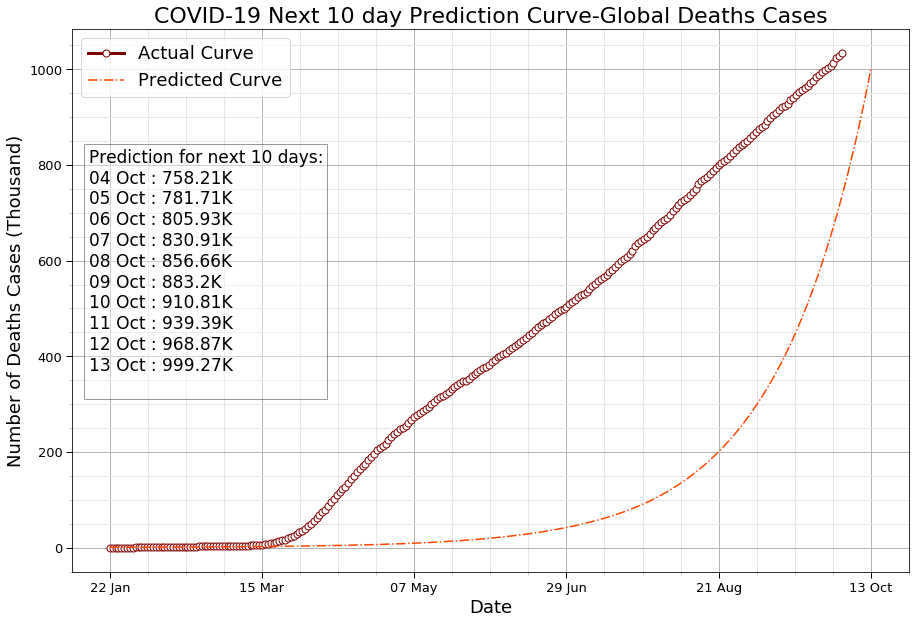

In [85]:
thousand = 1000
prediction_days = 10

temp_data = df_deaths.iloc[:,5:].sum(axis =0)
data = np.power(10,model2.predict(np.arange(1,len(temp_data)+prediction_days+1)))
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)


date = np.arange(0,len(temp_data))
# xnew = np.linspace(date.min(), date.max(), 10)
# spl = make_interp_spline(date, t, k=1)  # type: BSpline
# power_smooth = spl(xnew)

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data/thousand,"-.",color="maroon",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data/thousand,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-1)[0]/thousand)+"K\n"

plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=12)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("COVID-19 Next 10 day Prediction Curve-Global Deaths Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Deaths Cases (Thousand)",fontsize =18)

# plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.savefig(out+"Prediction Curve2.png")
plt.show()

In [92]:
start_date = "6/10/20"
sd= dd(start_date,"1/22/20")
nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays
data_confirmed = np.power(10,model.predict(np.arange(1,len(data_y)+prediction_days+1)))
data_deaths = np.power(10,model2.predict(np.arange(1,len(data_y)+prediction_days+1)))
pd.DataFrame([total[sd:],
              list(np.int64(np.round(data_confirmed[sd:].reshape(-1)/lakh,2)*lakh)),
              list(df_confirmed.iloc[:,5:].sum(axis =0)[sd:]),
              list(np.int64(np.round(data_deaths[sd:].reshape(-1)/thousand,2)*thousand)),
             list(df_deaths.iloc[:,5:].sum(axis =0)[sd:])],
             ["Date","Confirmed(Predicted)","Confirmed(Actual)","Deaths(Predicted)","Deaths(Actual)"]
            ).transpose().set_index("Date")

,Confirmed(Predicted),Confirmed(Actual),Deaths(Predicted),Deaths(Actual)
Date,,,,
10 Jun,7598999,7387034,24390,417623
11 Jun,7720000,7525216,25100,422322
12 Jun,7843000,7653814,25830,426545
13 Jun,7968000,7789270,26580,430722
14 Jun,8095000,7922027,27350,434129
15 Jun,8223999,8041844,28150,437559
16 Jun,8356000,8183744,28970,444294
17 Jun,8489000,8326301,29810,449396
18 Jun,8624000,8466697,30680,454386


# COVID-19 Daily Analysis
<hr>


## 1. Daily New Confirmed Cases and Deaths

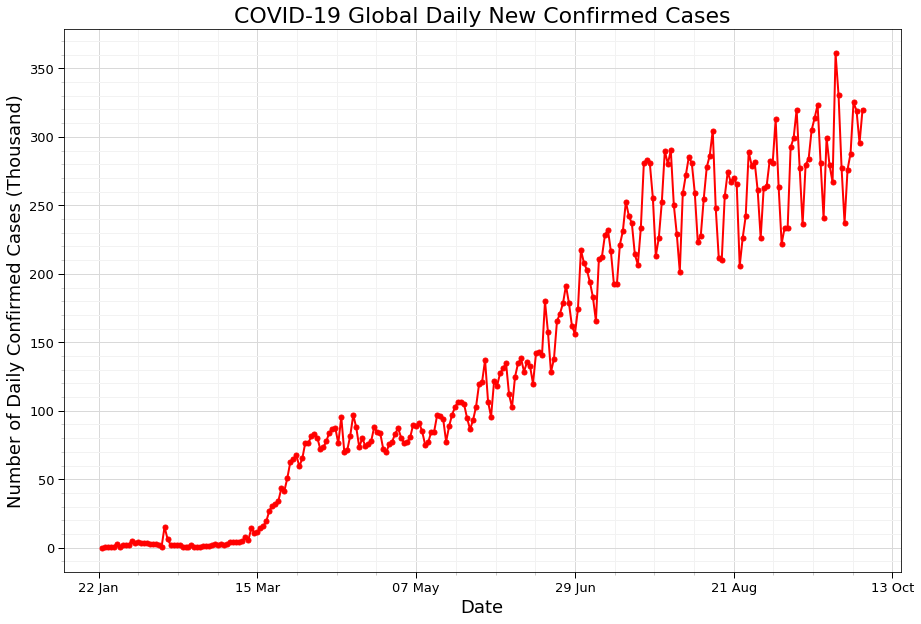

In [93]:
# Data
temp_data = np.nan_to_num(df_confirmed.sum()[5:].diff())


# Plot
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)


date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=2, linestyle='-', marker='o',markersize=5)
plt.plot(date,temp_data/thousand,"-.",color="red",**marker_style)


nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=12)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.85", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.95", which = 'minor')

# Plot Title
plt.title("COVID-19 Global Daily New Confirmed Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Daily Confirmed Cases (Thousand)",fontsize =18)

# plt.yscale("log")
plt.tick_params(labelsize = 13) 
plt.savefig(out+"daily confirmed cases global.png")
plt.show()

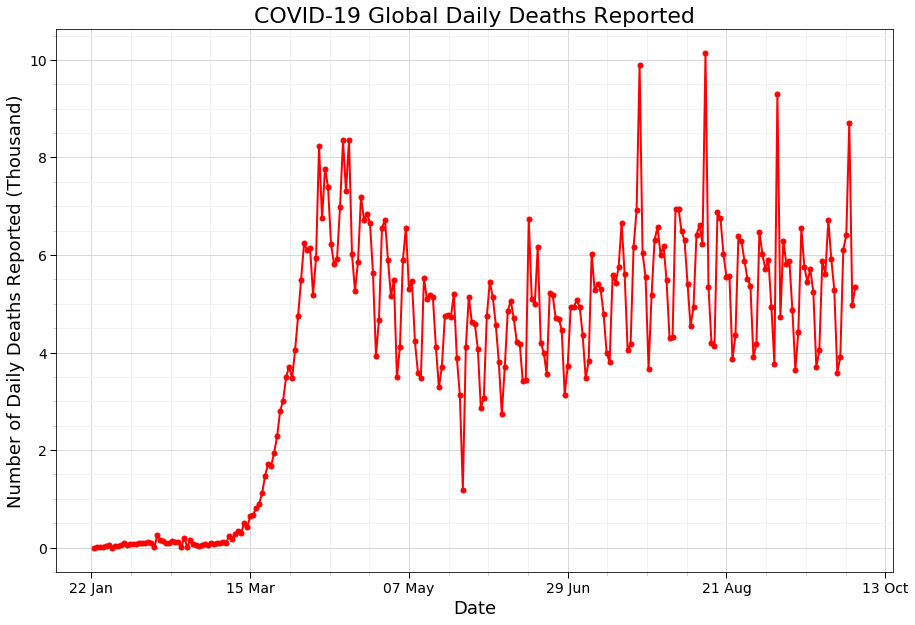

In [94]:
# Data
temp_data = np.nan_to_num(df_deaths.sum()[5:].diff())


# Plot
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)


date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=2, linestyle='-', marker='o',markersize=5)
plt.plot(date,temp_data/thousand,"-.",color="red",**marker_style)


nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.85", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.95", which = 'minor')

# Plot Title
plt.title("COVID-19 Global Daily Deaths Reported",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Daily Deaths Reported (Thousand)",fontsize =18)

# plt.yscale("log")
plt.savefig(out+"daily deaths cases Global.png")
plt.show()

## 2.Daily New Cases in Different Countries

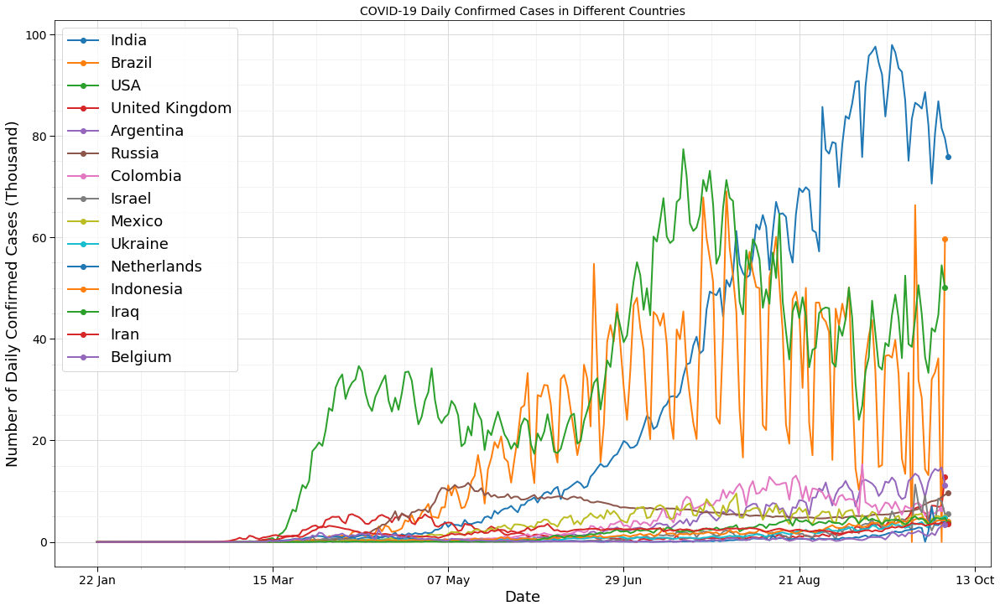

In [98]:
thoudand = 1000
temp = df_confirmed.groupby('country').sum().diff(axis=1).sort_values(df_deaths.columns[-1],ascending =False).head(15).replace(np.nan,0)
threshold = 0
f = plt.figure(figsize=(20,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    t = temp.loc[temp.index== country].values[0]
    t = t[t>=threshold]
    
    date = np.arange(0,len(t[:]))
    plt.plot(date,t/thoudand,'-o',label = country,linewidth =2, markevery=[-1])


nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.85", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.95", which = 'minor')

# Plot Title
plt.title("COVID-19 Daily Confirmed Cases in Different Countries",{'fontsize':14})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Daily Confirmed Cases (Thousand)",fontsize =18)

# plt.yscale("log")
plt.legend(fontsize=18) 
plt.savefig(out+"daily confirmed cases countrywise.png")
plt.show()

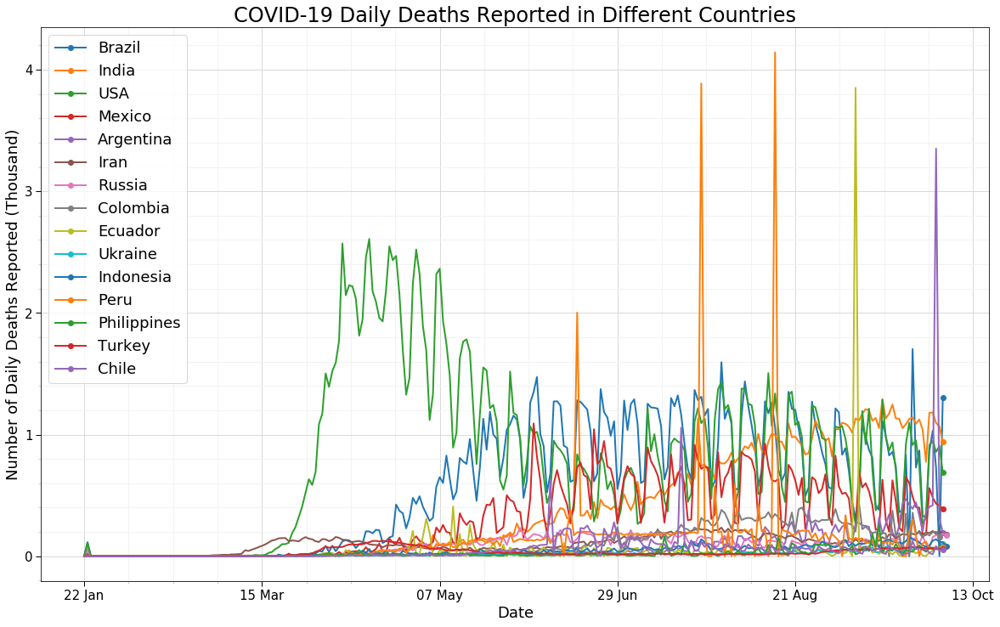

In [100]:
thoudand = 1000
temp = df_deaths.groupby('country').sum().diff(axis=1).sort_values(df_deaths.columns[-1],ascending =False).head(15).replace(np.nan,0)
threshold = 0
f = plt.figure(figsize=(20,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    t = temp.loc[temp.index== country].values[0]
    t = t[t>=threshold]
    
    date = np.arange(0,len(t[:]))
    plt.plot(date,t/thoudand,'-o',label = country,linewidth =2, markevery=[-1])


nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=15)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.85", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.95", which = 'minor')

# Plot Title
plt.title("COVID-19 Daily Deaths Reported in Different Countries",{'fontsize':24})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Daily Deaths Reported (Thousand)",fontsize =18)

# plt.yscale("log")
plt.legend(fontsize=18) 
plt.savefig(out+"daily deaths reported countrywise.png")
plt.show()